# Energy and time Predictions for the kinarm reaching model. 

In the following code we create a kinarm model and perform optimizations to find the trajectories and movement times for reaches of different distances, and different valuations of time.

if you set 'theGeneratePlots=1', you will get 6 plots per optimization.


In [1]:
#%% Loop across distances and valuations to generate double-pendulum distance/time predictions. 
import DoublePendulumClass as dp
import numpy as np
import matplotlib.pyplot as plt
import colour
%config InlineBackend.figure_formats = ['svg']
import sys
sys.path.insert(0,'parameterFiles')

# model that has equations to compute endpoint jacobians, equations of motion, and energy. 
sim = dp.kinarmModel()
#sim = dp.PointMass()

# starting x and y
x = 0.0
ys = 0.20
xystart = np.array([x,ys])

loopValuation = [50, 10, 7, 5, 3, 1, .75, .5, .25]
loopdist = np.array([.0025, .005, .01, .025, .05, .075, .1, .2, .25, .3, .35, .4, .45, .5])

from colour import Color
red = Color("red")
colors = list(red.range_to(Color("green"),10))

### storing the main results: durations, speeds, costs.
M = len(loopValuation)
N = len(loopdist)
duration      = np.zeros([M, N])
J             = np.zeros([M, N])
costFR        = np.zeros([M, N])
costWork      = np.zeros([M, N])
costTime      = np.zeros([M, N])
peakhandspeed = np.zeros([M, N])
solved        = np.zeros([M, N])
distances     = np.zeros([M, N])
mDist = 0
nVal = 0

### store returned trajectories
# store trajectories
trajRows = list() #ultimately the 2D matrix storage
trajCols = list() # cols get reset each inner loop
# store returned Opti variables
optiRows = list() # ultimately the 2D matrix storage 
optiCols = list() # cols get reset each inner loop

### setup the optimization. 
optiPrev = sim.movementTimeOptSetup(
  theTimeValuation  = 1.0, 
  theN              = 50, 
  theFRCoef = 0.085)

### solve the opt once, as a fall-back plan we can then always use optiOrig as initial guess. 
trajOrig, optiOrig = sim.updateGuessAndSolve(optiPrev, 
  xystart, 
  xystart + np.array([x,.10]), 
  theDurationInitial  = 0.5,
  theTimeValuation    = 1,
  theGeneratePlots    = 0)
dGuess = trajOrig.duration

### initial guess at the solution trajectory
prevSol = []
### perform the loop across distances and valuations. 
### the return matrix

for i in loopdist:
  for j in loopValuation:
    trajResult, optiReturn = sim.updateGuessAndSolve(optiPrev, 
      xystart, 
      xystart + np.array([x,i]), 
      theDurationInitial  = dGuess,
      theTimeValuation    = j,
      theGeneratePlots    = 0)
    
    # if we found a solution:
    if trajResult.solved:
      # unpack the results
      duration[nVal,mDist]      = trajResult.duration
      J[nVal,mDist]             = trajResult.costJ
      costFR[nVal,mDist]        = trajResult.costFR
      costWork[nVal,mDist]      = trajResult.costWork
      costTime[nVal,mDist]      = trajResult.costTime
      peakhandspeed[nVal,mDist] = trajResult.peakhandspeed
      solved[nVal,mDist]        = trajResult.solved
      distances[nVal,mDist]     = i
      # update the optiPrev, only if solved == true.
      #optiPrev  = optiReturn
      dGuess    = trajResult.duration
    
    #increment inner
    nVal += 1
    trajCols.append(trajResult)
    optiCols.append(optiReturn)

  
  #reset col counter; increase mDist
  nVal = 0
  mDist += 1
  trajRows.append(trajCols)
  optiRows.append(optiCols)
  
  optiPrev = optiOrig
  trajCols = []
# %%



******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit http://projects.coin-or.org/Ipopt
******************************************************************************

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:     2428
Number of nonzeros in inequality constraint Jacobian.:     1174
Number of nonzeros in Lagrangian Hessian.............:      817

Total number of variables............................:      919
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equa

In [ ]:
distances

In [2]:
solved

array([[0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 1., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1.],
       [1., 0., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1.],
       [0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])

(0.0, 7.0)

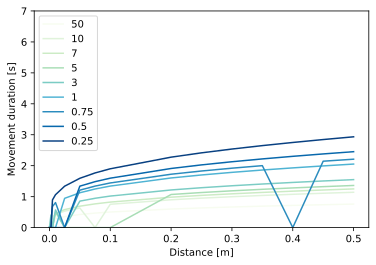

In [3]:
#%% Figure 1: distance / time 

f,ax = plt.subplots()
for v in range(0,len(loopValuation)):
#v = 0
  xtemp = loopdist.copy()
  y = duration.copy()
  y = y[v,:]
  y = y.T
  ytemp = np.concatenate(([0],y))

  xtemp = np.concatenate(([0],xtemp))
  plt.plot(xtemp,ytemp,label=loopValuation[v],color = distcolors[v])

plt.legend()
# %%
plt.xlabel("Distance [m]")
plt.ylabel("Movement duration [s]")
ax.set_ylim(0,7)


In [ ]:
saveDict = {
  "tSol":duration,
  "maxspeed":peakhandspeed,
  "dists":distances}
import scipy
scipy.io.savemat('file.mat', saveDict)


In [ ]:
#%% Figure 2: distance peak speed / distance
f,ax = plt.subplots()
for v in range(0,len(loopValuation)):
#v = 0
  xtemp = loopdist.copy()
  y = peakhandspeed.copy()
  y = y[:,v]
  ytemp = np.concatenate(([0],y))

  xtemp = np.concatenate(([0],xtemp))
  plt.plot(xtemp,ytemp, label=loopValuation[v],color = distcolors[v])
  plt.xlabel("Distance [m]")
  plt.ylabel("Peak hand speed [m/s]")
  plt.legend()
# %%

In [ ]:
#%% Figure 3: 3 valuations, hand speed vs time
def plotBells(theList):
  for i in range(0,len(theList)):
    tempStruct = theList[i]  
    plt.plot(tempStruct.time,tempStruct.handspeed,distcolors[i])

f,ax = plt.subplots()
plotBells(trajRows[1])
plotBells(trajRows[3])
plotBells(trajRows[-1])

plt.ylabel("Hand speed [m/s]")
plt.xlabel("Time [s]")


In [ ]:
# #%% Figure 4: COST plot. 
# f,ax = plt.subplots()
# v = np.where(loopValuation ==1)

# xtemp = loopdist.copy()
# xtemp = np.concatenate(([0],xtemp))

# y = workCost.copy()
# y = y[:,v]
# ytemp = np.concatenate(([0],y))
# y2 = frCost.copy()
# y2 = y2[:,v]
# y2temp = np.concatenate([0],y2)

# plt.plot(xtemp,ytemp, label=loopValuation[v],color = distcolors[v])
# plt.plot(xtemp,ytemp, label=loopValuation[v],color = distcolors[v])
# d
# plt.xlabel("Distance [m]")
# plt.ylabel("Peak hand speed [m/s]")
# plt.legend()
# # %%
